# Notes

[Population data](https://www.ons.gov.uk/peoplepopulationandcommunity/populationandmigration/populationestimates/datasets/populationestimatesforukenglandandwalesscotlandandnorthernireland)

[Poverty data](https://trustforlondon.org.uk/data/poverty-borough/)

In [25]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd

# Load crime and population data

In [26]:
# Load crime data
historical_df  = pd.read_csv('data/borough-historical.csv')
recent_df = pd.read_csv('data/borough-recent.csv')

# Load population data
population_df = pd.read_csv('data/population.csv')
poverty_rate_df = pd.read_csv('data/poverty-rate.csv')

In [27]:
historical_df.head(2)

,MajorText,MinorText,LookUp_BoroughName,201004,201005,201006,201007,201008,201009,201010,...,202101,202102,202103,202104,202105,202106,202107,202108,202109,202110
0,Arson and Criminal Damage,Arson,Barking and Dagenham,6,5,11,10,6,6,13,...,4,6,4,6,6,5,4,12,5,7
1,Arson and Criminal Damage,Criminal Damage,Barking and Dagenham,208,193,227,220,204,163,199,...,100,104,80,99,128,141,130,144,111,126


In [28]:
recent_df.head(2)

,MajorText,MinorText,LookUp_BoroughName,202111,202112,202201,202202,202203,202204,202205,...,202301,202302,202303,202304,202305,202306,202307,202308,202309,202310
0,Arson and Criminal Damage,Arson,Barking and Dagenham,6,1,4,4,3,5,5,...,3,3,2,2,5,2,5,8,5,4
1,Arson and Criminal Damage,Criminal Damage,Barking and Dagenham,109,116,126,110,116,126,120,...,96,101,118,103,109,126,138,118,129,96


In [29]:
# Merging recent and historical data
df = pd.merge(historical_df, recent_df, on  = ['LookUp_BoroughName', 'MajorText', 'MinorText'], how = 'outer').fillna(0).sort_index(axis = 1)
df.head()

,201004,201005,201006,201007,201008,201009,201010,201011,201012,201101,...,202304,202305,202306,202307,202308,202309,202310,LookUp_BoroughName,MajorText,MinorText
0,6.0,5.0,11.0,10.0,6.0,6.0,13.0,13.0,14.0,5.0,...,2.0,5.0,2.0,5.0,8.0,5.0,4.0,Barking and Dagenham,Arson and Criminal Damage,Arson
1,208.0,193.0,227.0,220.0,204.0,163.0,199.0,178.0,138.0,173.0,...,103.0,109.0,126.0,138.0,118.0,129.0,96.0,Barking and Dagenham,Arson and Criminal Damage,Criminal Damage
2,49.0,58.0,59.0,47.0,46.0,51.0,52.0,62.0,49.0,50.0,...,36.0,28.0,30.0,25.0,32.0,41.0,30.0,Barking and Dagenham,Burglary,Burglary Business and Community
3,118.0,102.0,124.0,137.0,153.0,136.0,116.0,140.0,105.0,165.0,...,63.0,50.0,65.0,50.0,75.0,86.0,71.0,Barking and Dagenham,Burglary,Domestic Burglary
4,9.0,6.0,5.0,12.0,9.0,7.0,11.0,11.0,4.0,9.0,...,25.0,26.0,36.0,21.0,16.0,20.0,33.0,Barking and Dagenham,Drug Offences,Drug Trafficking


In [30]:
# Data is in monthly format. If you want to aggregate to yearly to analyse yearly trends.

def aggregate_to_yearly(df:pd.DataFrame) -> pd.DataFrame:

    yearly_df = df.fillna(0).copy()

    # Loop through unique years present in the dataset
    years = {col[:4] for col in yearly_df.columns if col.isdigit()}

    for year in years:
        # List columns for that year
        monthly_columns = [col for col in yearly_df.columns if col.startswith(year)]
        
        # Sum the monthly columns and create a new yearly column
        yearly_df[year] = yearly_df[monthly_columns].sum(axis=1)
        
        yearly_df.drop(monthly_columns, axis=1, inplace=True)

    return yearly_df.sort_index(axis = 1)

yearly_df = aggregate_to_yearly(df)
yearly_df.head()

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,LookUp_BoroughName,MajorText,MinorText
0,84.0,132.0,75.0,52.0,65.0,77.0,74.0,78.0,58.0,68.0,48.0,66.0,52.0,39.0,Barking and Dagenham,Arson and Criminal Damage,Arson
1,1730.0,2017.0,1613.0,1550.0,1553.0,1678.0,1816.0,1631.0,1392.0,1435.0,1276.0,1388.0,1433.0,1134.0,Barking and Dagenham,Arson and Criminal Damage,Criminal Damage
2,473.0,740.0,665.0,574.0,541.0,448.0,454.0,364.0,387.0,361.0,282.0,267.0,284.0,303.0,Barking and Dagenham,Burglary,Burglary Business and Community
3,1131.0,1625.0,1795.0,1669.0,1369.0,1184.0,840.0,1229.0,1285.0,1185.0,935.0,924.0,867.0,649.0,Barking and Dagenham,Burglary,Domestic Burglary
4,74.0,82.0,76.0,69.0,89.0,53.0,79.0,64.0,76.0,88.0,163.0,136.0,171.0,232.0,Barking and Dagenham,Drug Offences,Drug Trafficking


# EDA

In [31]:
df['MajorText'].unique()

array(['Arson and Criminal Damage', 'Burglary', 'Drug Offences',
       'Historical Fraud and Forgery',
       'Miscellaneous Crimes Against Society', 'Possession of Weapons',
       'Public Order Offences', 'Robbery', 'Sexual Offences', 'Theft',
       'Vehicle Offences', 'Violence Against the Person'], dtype=object)

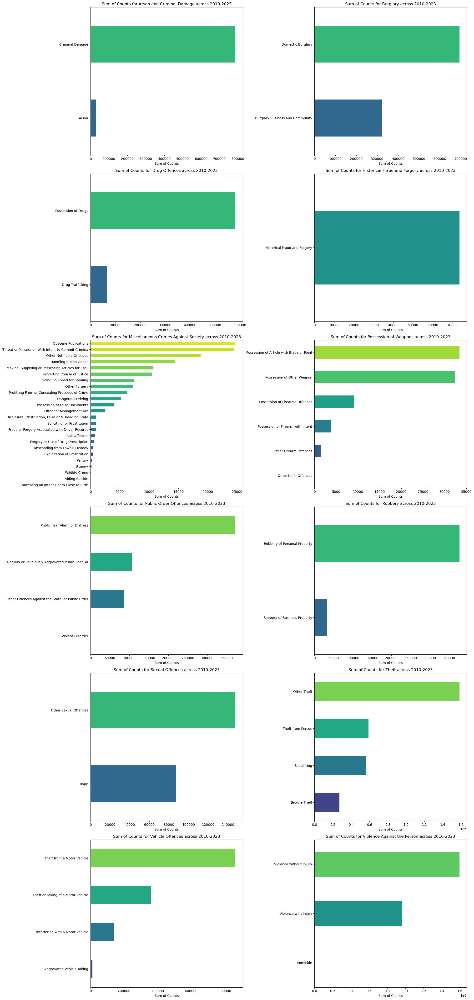

In [32]:
'''
Number of Major Categories, and there Minor Categories from 2010 to 2023
'''

# Getting unique major categories
major_categories = df['MajorText'].unique()

# Number of rows and columns for the subplot grid
n_rows = len(major_categories) // 2 + len(major_categories) % 2
n_cols = 2

# Creating subplots
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 7 * n_rows))

for i, category in enumerate(major_categories):
    # Filtering data for each major category
    major_cat = df[df['MajorText'] == category].copy()
    # Grouping by minor category and summing
    grouped_data = major_cat.groupby(by='MinorText').sum(numeric_only = True)

    

    # Plotting
    ax = axes[i // n_cols, i % n_cols]
    grouped_data.sum(axis=1).sort_values().plot(kind='barh', ax=ax, color=sns.color_palette("viridis", len(grouped_data)))
    ax.set_title(f'Sum of Counts for {category} across 2010-2023')
    ax.set_xlabel('Sum of Counts')
    ax.set_ylabel('')

plt.subplots_adjust()
plt.tight_layout()

plt.show()

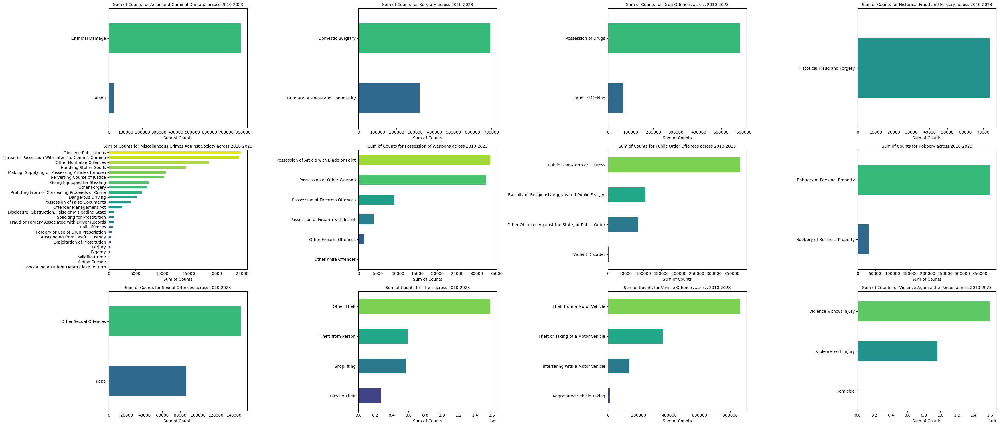

In [33]:
major_categories = df['MajorText'].unique()

n_cols = 4
n_rows = len(major_categories) // n_cols + len(major_categories) % n_cols

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(35, 5 * n_rows))  # Adjust the figsize as needed

font_size = 10  

for i, category in enumerate(major_categories):
    # Filtering data for each major category
    major_cat = df[df['MajorText'] == category].copy()

    # Grouping by minor category and summing
    grouped_data = major_cat.groupby(by='MinorText').sum(numeric_only = True)
    # Plotting
    ax = axes[i // n_cols, i % n_cols]
    grouped_data.sum(axis=1).sort_values().plot(kind='barh', ax=ax, color=sns.color_palette("viridis", len(grouped_data)))
    ax.set_title(f'Sum of Counts for {category} across 2010-2023', fontsize=font_size)
    ax.set_xlabel('Sum of Counts', fontsize=font_size)
    ax.tick_params(labelsize=font_size)
    ax.set_ylabel('')

plt.subplots_adjust(hspace=0.5, wspace=0.3)  
plt.tight_layout()

plt.show()


#  Timeseries analysis

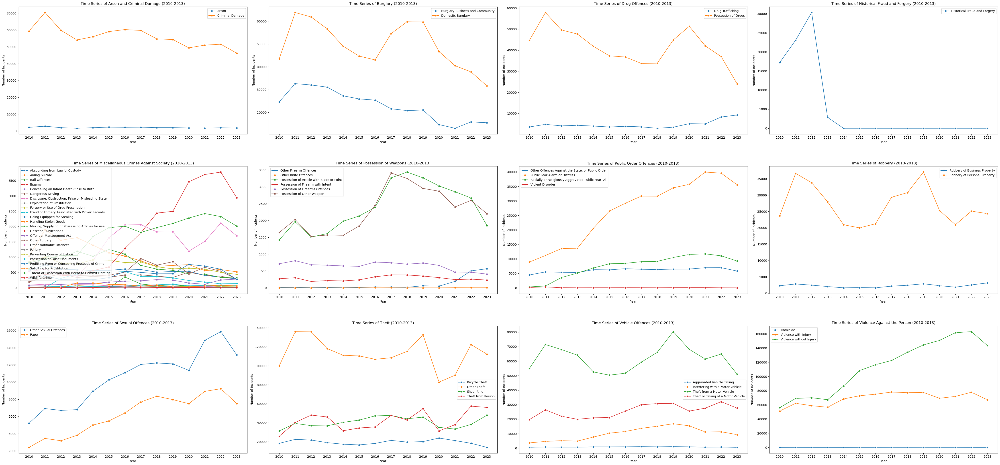

In [34]:
df_copy = df.drop(['LookUp_BoroughName'], axis = 1).copy()

# Timeseries of each Major Category. What are trends of each major category like?
grouped = df_copy.groupby(by=['MajorText', 'MinorText']).agg('sum')
grouped.head()

grouped_yearly = aggregate_to_yearly(grouped)
#grouped_yearly = grouped_yearly.transpose()

major_cat = df_copy['MajorText'].unique()

# Assuming 'major_cat' contains unique major categories and 'grouped_yearly' is your DataFrame
n_categories = len(major_cat)

n_cols = 4
n_rows = len(major_categories) // n_cols + len(major_categories) % n_cols

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(45, 7 * n_rows))  # Adjust the figsize as needed

font_size = 10  

for i, category in enumerate(major_cat):
    # Retrieve data for the current category
    data = grouped_yearly.loc[category].transpose()

    row_index = i // n_cols
    col_index = i % n_cols

    # Plotting each column in the current subplot
    for column in data.columns:
        sns.lineplot(x=data.index, y=data[column], ax=axes[row_index, col_index], marker='o', label=column)
    # Customizing the subplot
    axes[row_index, col_index].set_title(f'Time Series of {category} (2010-2013)')
    axes[row_index, col_index].set_xlabel('Year')
    axes[row_index, col_index].set_ylabel('Number of Incidents')
    axes[row_index, col_index].set_xticks(data.index)
    axes[row_index, col_index].legend()

plt.subplots_adjust(hspace=0.5, wspace=0.3)  
plt.tight_layout()

plt.show()
    

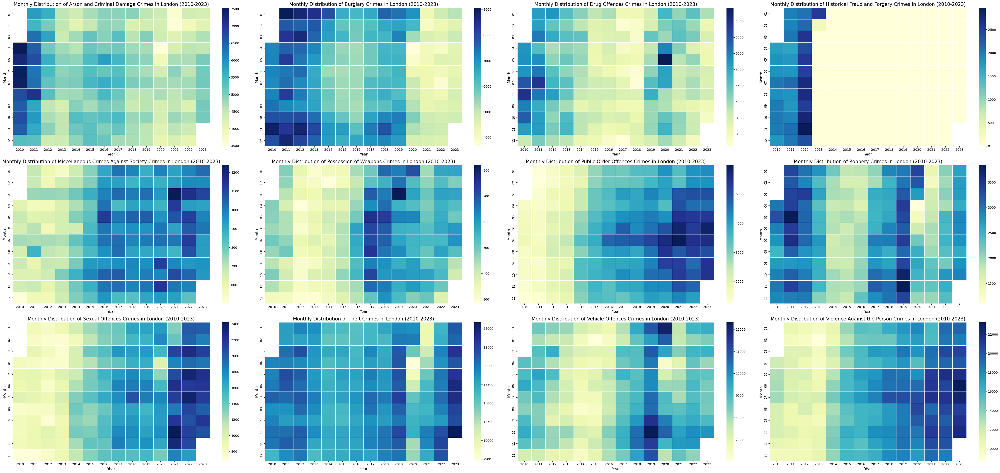

In [35]:
major_cat = df_copy['MajorText'].unique()

# Assuming 'major_cat' contains unique major categories and 'grouped_yearly' is your DataFrame
n_categories = len(major_cat)

n_cols = 4
n_rows = len(major_categories) // n_cols + len(major_categories) % n_cols

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(45, 7 * n_rows))  # Adjust the figsize as needed

font_size = 10  

# Loop through each major category
for i, cat in enumerate(major_cat):
    # Filter data for the current category
    filted_data = df[df['MajorText'] == cat].copy()

    row_index = i // n_cols
    col_index = i % n_cols

    grouped = filted_data.groupby(by=['LookUp_BoroughName']).sum(numeric_only = True).sum(numeric_only = True)
    grouped_df = pd.DataFrame(grouped).reset_index()
    grouped_df['Year'] = grouped_df['index'].str[:4]
    grouped_df['Month'] = grouped_df['index'].str[4:] 
    monthly_pivot = grouped_df.pivot(index = "Month", columns="Year", values=0)
    monthly_pivot = monthly_pivot.astype(float)

    # Plotting heatmap in the current subplot
    sns.heatmap(monthly_pivot, cmap="YlGnBu", linewidths=.5,  ax=axes[row_index, col_index])

    axes[row_index, col_index].set_title(f'Monthly Distribution of {cat} Crimes in London (2010-2023)', fontsize=15)
    axes[row_index, col_index].set_xlabel('Year', fontsize=12)
    axes[row_index, col_index].set_ylabel('Month', fontsize=12)

plt.subplots_adjust(hspace=0.5, wspace=0.3)  
plt.tight_layout()

plt.show()

# Counts per Borough

When looking at spatial plots we use crime rate per 1000 people.

In [36]:
# Merging recent and historical data
df = pd.merge(df, population_df, on  = ['LookUp_BoroughName'], how = 'outer').fillna(0).sort_index(axis = 1)
df = pd.merge(df, poverty_rate_df, on  = ['LookUp_BoroughName'], how = 'outer').fillna(0).sort_index(axis = 1)
df.head()

,201004,201005,201006,201007,201008,201009,201010,201011,201012,201101,...,202306,202307,202308,202309,202310,LookUp_BoroughName,MajorText,MinorText,population,poverty_Rate
0,6.0,5.0,11.0,10.0,6.0,6.0,13.0,13.0,14.0,5.0,...,2.0,5.0,8.0,5.0,4.0,Barking and Dagenham,Arson and Criminal Damage,Arson,218534.0,0.29
1,208.0,193.0,227.0,220.0,204.0,163.0,199.0,178.0,138.0,173.0,...,126.0,138.0,118.0,129.0,96.0,Barking and Dagenham,Arson and Criminal Damage,Criminal Damage,218534.0,0.29
2,49.0,58.0,59.0,47.0,46.0,51.0,52.0,62.0,49.0,50.0,...,30.0,25.0,32.0,41.0,30.0,Barking and Dagenham,Burglary,Burglary Business and Community,218534.0,0.29
3,118.0,102.0,124.0,137.0,153.0,136.0,116.0,140.0,105.0,165.0,...,65.0,50.0,75.0,86.0,71.0,Barking and Dagenham,Burglary,Domestic Burglary,218534.0,0.29
4,9.0,6.0,5.0,12.0,9.0,7.0,11.0,11.0,4.0,9.0,...,36.0,21.0,16.0,20.0,33.0,Barking and Dagenham,Drug Offences,Drug Trafficking,218534.0,0.29


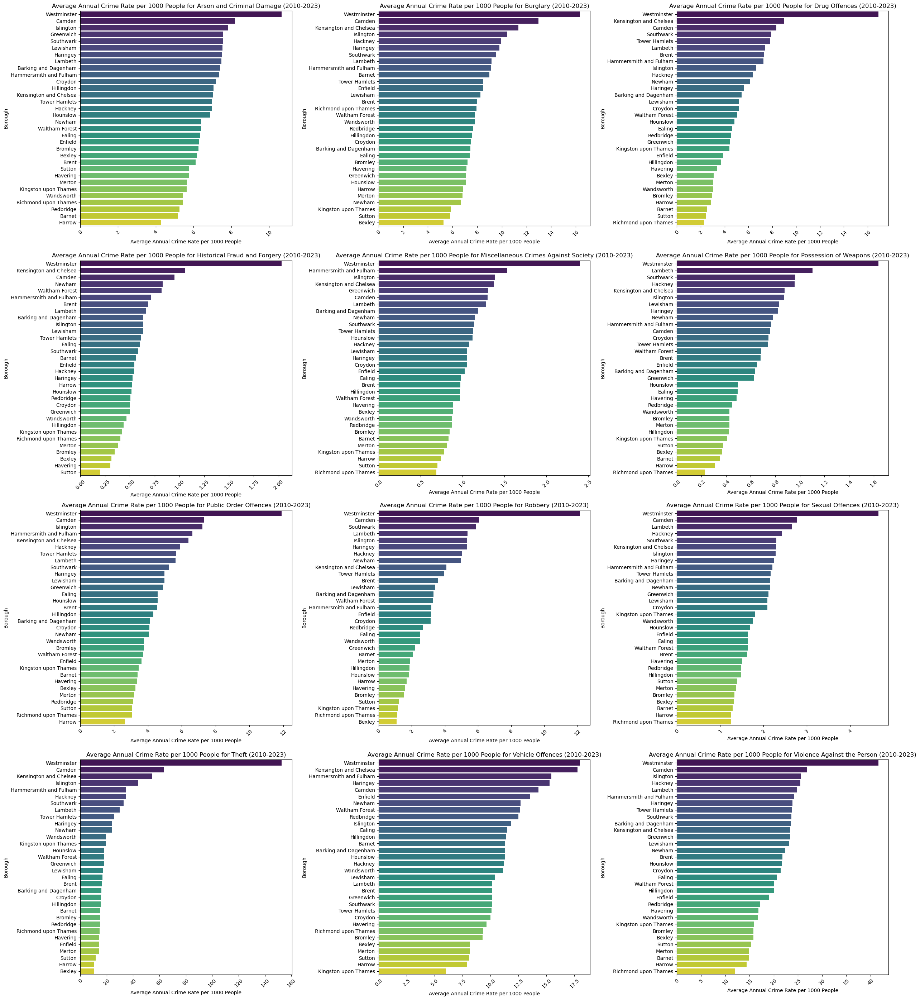

In [37]:
# Extracting the unique major categories
major_categories = df['MajorText'].unique()

n_cols = 3
n_rows = len(major_categories) // n_cols + len(major_categories) % n_cols

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(25, 7 * n_rows))  # Adjust the figsize as needed

font_size = 10  


# Looping through each major category to plot
for i, category in enumerate(major_categories):
    # Filtering data for the current category
    filtered_data = yearly_df[yearly_df['MajorText'] == category].copy()
    total_by_borough = filtered_data.groupby('LookUp_BoroughName').sum(numeric_only = True).sum(axis=1, numeric_only = True).sort_values(ascending=False)
    total_by_borough = pd.merge(pd.DataFrame(total_by_borough), population_df, on=['LookUp_BoroughName'], how = 'outer').fillna(0)
    total_by_borough['average_yearly_crime_rate_per_1000'] = 1000 * (total_by_borough[0]/total_by_borough['population'])/14
    total_by_borough = total_by_borough[total_by_borough['LookUp_BoroughName']!='London Heathrow and London City Airports']
    total_by_borough.sort_values(by='average_yearly_crime_rate_per_1000', ascending=False, inplace = True)

    # Getting crime per 1000 people
    # Determining the position of the current plot
    row = i // n_cols
    col = i % n_cols

    # Creating the barplot
    sns.barplot(y=total_by_borough['LookUp_BoroughName'], x=total_by_borough['average_yearly_crime_rate_per_1000'], palette="viridis", ax=axes[row, col])
    axes[row, col].set_title(f'Average Annual Crime Rate per 1000 People for {category} (2010-2023)', fontsize=12)
    axes[row, col].set_xlabel('Average Annual Crime Rate per 1000 People', fontsize=10)
    axes[row, col].set_ylabel('Borough', fontsize=font_size)
    axes[row, col].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()

In [53]:
# Merging shapefiles
def merge_shape_with_data(shapefile : gpd.GeoDataFrame, df : pd.DataFrame, index_in_shapefle : str = 'NAME',index_in_data : str = 'Borough'):
    '''
    For borough dataset: index_in_shapefile = 'NAME' and index_in_data = 'Borough'
    For lsoa dataset : index_in_shapefile = 'LSOA11NM; and index_in_data = 'LSOA Name'
    '''
    
    grouped = df.groupby(by = index_in_data).sum(numeric_only=True)

    merged = shapefile.set_index(index_in_shapefle).join(grouped)

    return merged

In [39]:
def plot_yearly_heatmap(df_shapefile, year, cutpoints=None):
    fig, ax = plt.subplots(1, 1, figsize=(15, 10))
    
    if cutpoints is not None:
        df_shapefile.plot(column=str(year), cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True,scheme='user_defined', classification_kwds={'bins':cutpoints})
    else:
        df_shapefile.plot(column=str(year), cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
    
    ax.set_title(f'Crimes in London Boroughs - {year}', fontsize=15)
    plt.axis('off')
    plt.show()

In [40]:
def plot_yearly_heatmaps_on_grid(df_shapefile, start_year, end_year, cutpoints=None, crime = None):
    # Number of years to plot
    num_years = end_year - start_year + 1

    # Create the figure with 6 columns and 2 rows
    fig, axes = plt.subplots(2, 6, figsize=(30, 10))  # Adjust figsize as needed
    axes = axes.flatten()  # Flatten the axes array for easy indexing

    # Iterate over each year and plot
    for i, year in enumerate(range(start_year, end_year + 1)):
        ax = axes[i]
        year_str = str(year)

        # Plotting for each year
        if cutpoints is not None:
            df_shapefile.plot(column=year_str, cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, scheme='user_defined', classification_kwds={'bins':cutpoints})
        else:
            df_shapefile.plot(column=year_str, cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

        # Set title for each subplot
        ax.set_title(f'{crime}\n in London Boroughs - {year}', fontsize=12)
        ax.axis('off')

    # Adjust the layout
    plt.tight_layout()
    plt.show()

# Spatial Temporal Plots per Major Category

In [41]:
# Loading shapefiles for Borough and LSOA
shapefile_borough = gpd.read_file("statistical-gis-boundaries-london/statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp")
shapefile_lose = gpd.read_file("statistical-gis-boundaries-london/statistical-gis-boundaries-london/ESRI/LSOA_2011_London_gen_MHW.shp")

In [42]:
shapefile_borough = shapefile_borough[shapefile_borough['NAME']!= 'City of London']

In [43]:
# Merging recent and historical data
yearly_df = pd.merge(yearly_df, population_df, on  = ['LookUp_BoroughName'], how = 'outer').fillna(0).sort_index(axis = 1)
yearly_df.head()

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,LookUp_BoroughName,MajorText,MinorText,population
0,84.0,132.0,75.0,52.0,65.0,77.0,74.0,78.0,58.0,68.0,48.0,66.0,52.0,39.0,Barking and Dagenham,Arson and Criminal Damage,Arson,218534.0
1,1730.0,2017.0,1613.0,1550.0,1553.0,1678.0,1816.0,1631.0,1392.0,1435.0,1276.0,1388.0,1433.0,1134.0,Barking and Dagenham,Arson and Criminal Damage,Criminal Damage,218534.0
2,473.0,740.0,665.0,574.0,541.0,448.0,454.0,364.0,387.0,361.0,282.0,267.0,284.0,303.0,Barking and Dagenham,Burglary,Burglary Business and Community,218534.0
3,1131.0,1625.0,1795.0,1669.0,1369.0,1184.0,840.0,1229.0,1285.0,1185.0,935.0,924.0,867.0,649.0,Barking and Dagenham,Burglary,Domestic Burglary,218534.0
4,74.0,82.0,76.0,69.0,89.0,53.0,79.0,64.0,76.0,88.0,163.0,136.0,171.0,232.0,Barking and Dagenham,Drug Offences,Drug Trafficking,218534.0


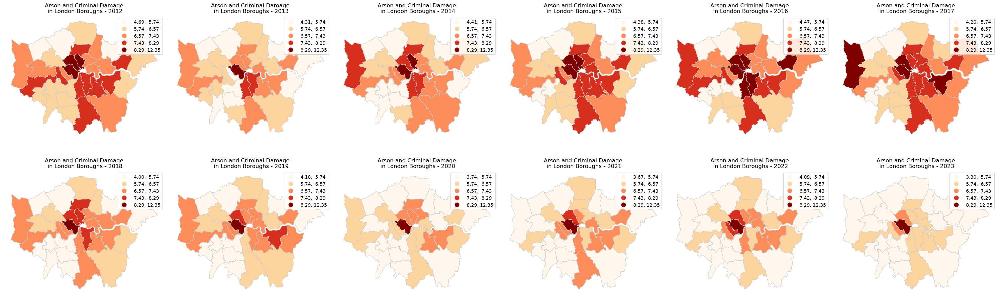

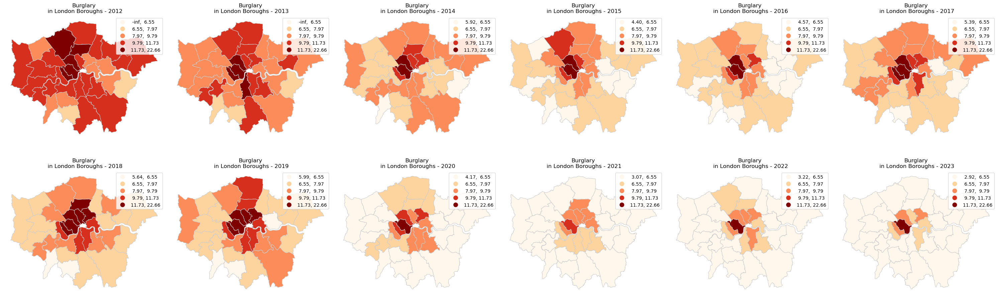

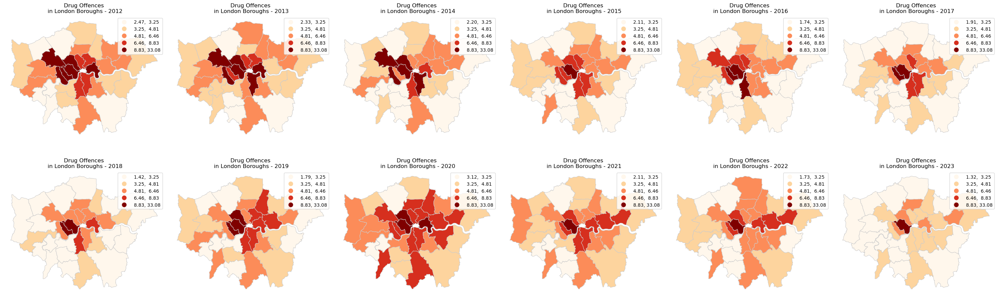

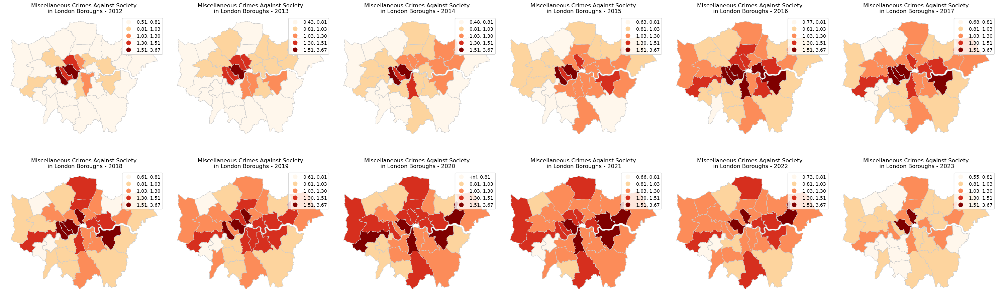

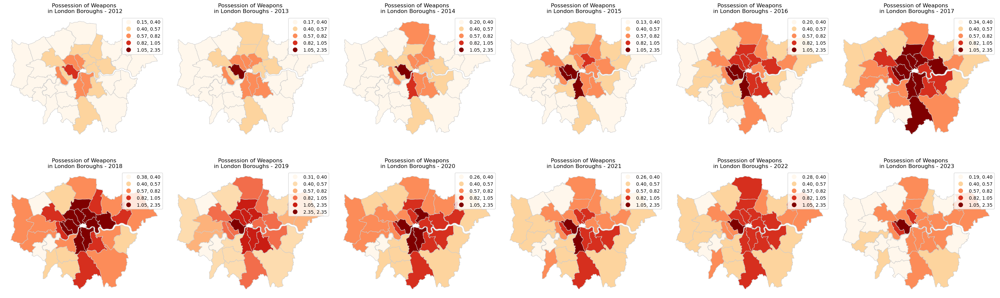

...

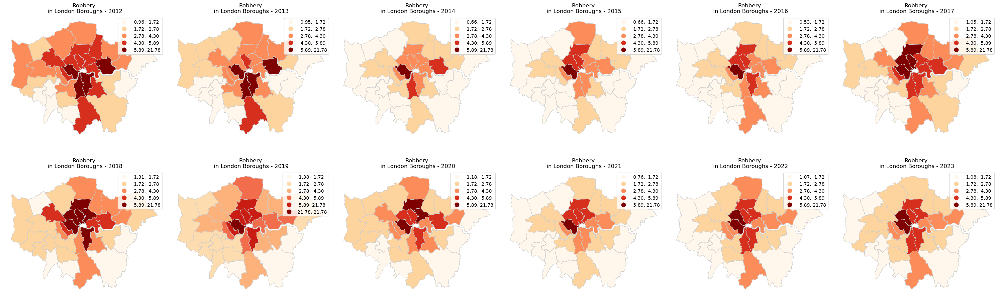

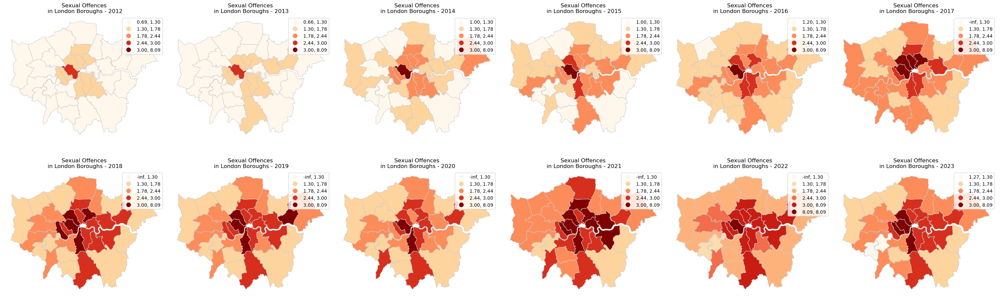

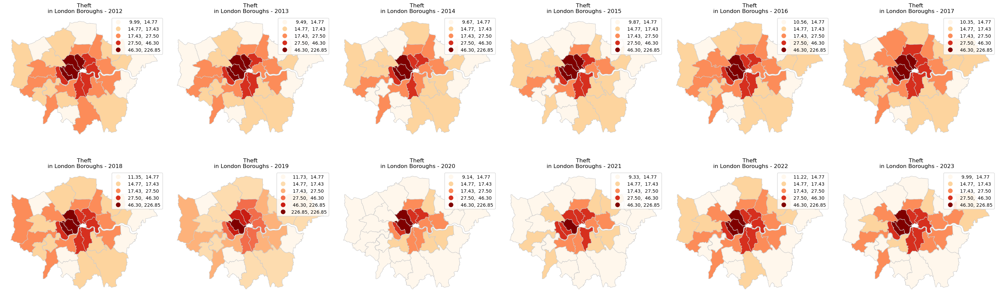

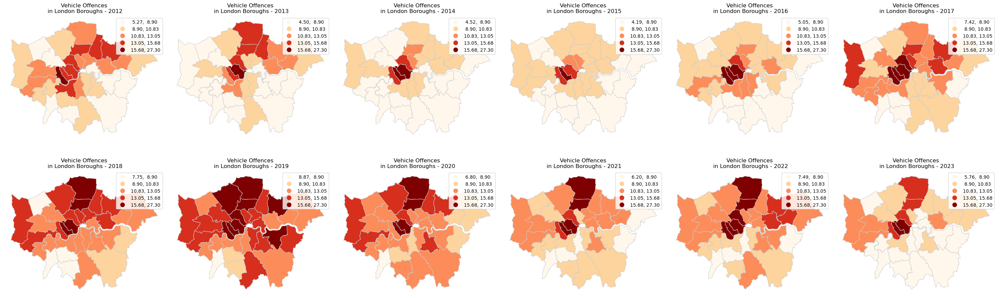

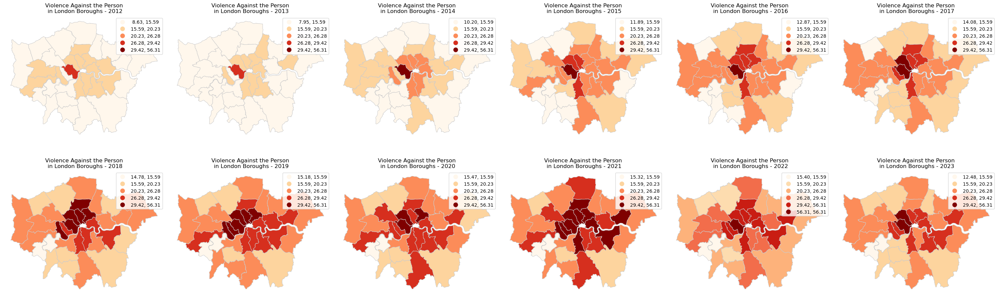

In [72]:
major_categories = yearly_df['MajorText'].unique()

for major_cat in major_categories:
       
       if major_cat == 'Historical Fraud and Forgery':
              continue

       filtered_data = yearly_df[yearly_df['MajorText']==major_cat].copy()

       merged_borough = merge_shape_with_data(shapefile=shapefile_borough, df = filtered_data, index_in_shapefle='NAME', index_in_data='LookUp_BoroughName').fillna(0)
       # Merging recent and historical data
       merged_borough['LookUp_BoroughName']  = merged_borough.index
       merged_borough = pd.merge(merged_borough, population_df, on  = ['LookUp_BoroughName'], how = 'outer').fillna(0).sort_index(axis = 1)
       year_columns = [int(year) for year in range(2010, 2024)]

       for year in year_columns:
              if f'{year}' in merged_borough.columns:
                     merged_borough[f'{year}'] = 1000*(merged_borough[f'{year}'] / merged_borough['population_y'])

       yearly_columns = merged_borough[['2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018',
              '2019', '2020', '2021', '2022', '2023']].stack()

       quantiles = yearly_columns.quantile([0.25, 0.5, 0.75, 0.9, 1])
       
       plot_yearly_heatmaps_on_grid(merged_borough, 2012, 2023, cutpoints=quantiles.round(2).to_list(), crime = major_cat)

In [ ]:
major_categories = yearly_df['MajorText'].unique()

for major_cat in major_categories:
       
       if major_cat == 'Historical Fraud and Forgery':
              continue

       filtered_data = yearly_df[yearly_df['MajorText']==major_cat].copy()

       merged_borough = merge_shape_with_data(shapefile=shapefile_borough, df = filtered_data, index_in_shapefle='NAME', index_in_data='LookUp_BoroughName').fillna(0)
       # Merging recent and historical data
       merged_borough['LookUp_BoroughName']  = merged_borough.index
       merged_borough = pd.merge(merged_borough, population_df, on  = ['LookUp_BoroughName'], how = 'outer').fillna(0).sort_index(axis = 1)
       year_columns = [int(year) for year in range(2010, 2024)]

       for year in year_columns:
              if f'{year}' in merged_borough.columns:
                     merged_borough[f'{year}'] = 1000*(merged_borough[f'{year}'] / merged_borough['population_y'])

       yearly_columns = merged_borough[['2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018',
              '2019', '2020', '2021', '2022', '2023']].stack()

       quantiles = yearly_columns.quantile([0.25, 0.5, 0.75, 0.9, 1])
       
       plot_yearly_heatmaps_on_grid(merged_borough, 2012, 2023, cutpoints=quantiles.round(2).to_list(), crime = major_cat)

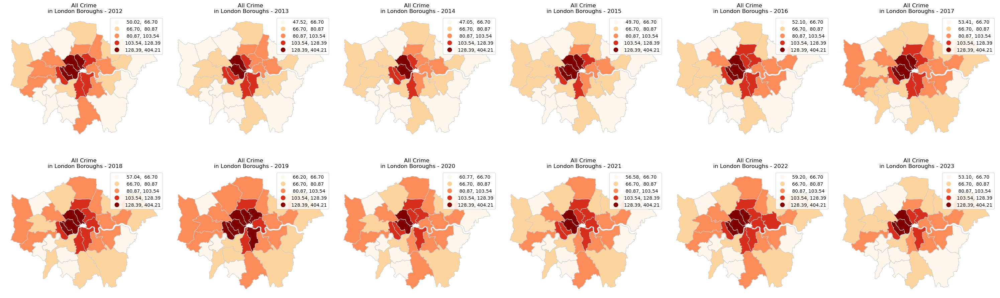

In [78]:
merged_borough = merge_shape_with_data(shapefile=shapefile_borough, df = aggregate_to_yearly(df), index_in_shapefle='NAME', index_in_data='LookUp_BoroughName').fillna(0)
merged_borough['LookUp_BoroughName']  = merged_borough.index
merged_borough = pd.merge(merged_borough, population_df, on  = ['LookUp_BoroughName'], how = 'outer').fillna(0).sort_index(axis = 1)
year_columns = [int(year) for year in range(2010, 2024)]

for year in year_columns:
        if f'{year}' in merged_borough.columns:
                merged_borough[f'{year}'] = 1000*(merged_borough[f'{year}'] / merged_borough['population_y'])

yearly_columns = merged_borough[['2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018',
        '2019', '2020', '2021', '2022', '2023']].stack()

quantiles = yearly_columns.quantile([0.25, 0.5, 0.75, 0.9, 1])

plot_yearly_heatmaps_on_grid(merged_borough, 2012, 2023, cutpoints=quantiles.round(2).to_list(), crime = 'All Crime')
